**Instructions**

Before running the code make sure to do the follow:

* git clone https://github.com/bainskarman/Alzheimer
* pip install -r requirements.txt
* Python version : 3.10.13 | packaged by conda-forge |

## Importing Libarires

In [ ]:
import sys
print(sys. version)

3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]


In [ ]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import re
from tqdm import tqdm
import pandas as pd
import seaborn as sns
import pathlib
import random
import tensorflow as tf
%load_ext autotime

time: 154 µs (started: 2024-04-16 04:18:32 +00:00)


## Demographics Data for MRI patients

**Data Description**
* Subject ID: A unique identifier for each subject/participant in the study.
* MRI ID: A unique identifier for each MRI scan performed on the subjects.
* Group: Indicates the group to which the subject belongs, typically categorized as either "Nondemented" or "Demented," based on clinical diagnosis.
* Visit: Represents the number of the visit during which the MRI scan was conducted.
* MR Delay: Time delay (in days) between the baseline visit and the MRI scan.
* M/F: Gender of the subject, where "M" typically stands for male and "F" for female.
* Hand: Handedness of the subject (e.g., "R" for right-handed).
* Age: Age of the subject at the time of the MRI scan.
* EDUC: Years of education completed by the subject.
* SES: Socioeconomic status of the subject. (NaN indicates missing data)
* MMSE: Mini-Mental State Examination score, a measure of cognitive function with a range typically from 0 to 30.
* CDR: Clinical Dementia Rating, a numeric scale used to quantify the severity of symptoms of dementia.
* eTIV: Estimated Total Intracranial Volume, a measure of the volume within the skull.
* nWBV: Normalized Whole Brain Volume, a measure of brain volume normalized to the subject's estimated total intracranial volume.
* ASF: Atlas Scaling Factor, a measure used to scale brain images to a common template or atlas.

In [ ]:
#Getting data directly from the source (OASIS Brain Data)
df = pd.read_excel('https://www.oasis-brains.org/files/oasis_longitudinal_demographics.xlsx')

time: 965 ms (started: 2024-04-16 04:21:10 +00:00)


Mapping the CDR values to 4 different categories which is gonna be the target classes.

In [ ]:
#Mapping the values of Demented (CDR) into different categories.
group_mapping = {
    0.0: 'Non Demented',
    0.5: 'Mild Demented',
    1.0: 'Moderate Demented',
    2.0: 'Highly Demented'
}

df['Actual Group'] = df['CDR'].map(group_mapping)

df_demographics_input = df
df.head()

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF,Actual Group
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1986.550000,0.696106,0.883440,Non Demented
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004.479526,0.681062,0.875539,Non Demented
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678.290000,0.736336,1.045710,Mild Demented
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1737.620000,0.713402,1.010000,Mild Demented
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1697.911134,0.701236,1.033623,Mild Demented


time: 26.9 ms (started: 2024-04-16 04:21:12 +00:00)


#### Analysis and EDA of Demographics Data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 373 entries, 0 to 372
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Subject ID    373 non-null    object 
 1   MRI ID        373 non-null    object 
 2   Group         373 non-null    object 
 3   Visit         373 non-null    int64  
 4   MR Delay      373 non-null    int64  
 5   M/F           373 non-null    object 
 6   Hand          373 non-null    object 
 7   Age           373 non-null    int64  
 8   EDUC          373 non-null    int64  
 9   SES           354 non-null    float64
 10  MMSE          371 non-null    float64
 11  CDR           373 non-null    float64
 12  eTIV          373 non-null    float64
 13  nWBV          373 non-null    float64
 14  ASF           373 non-null    float64
 15  Actual Group  373 non-null    object 
dtypes: float64(6), int64(4), object(6)
memory usage: 46.8+ KB
time: 15.8 ms (started: 2024-04-16 04:21:15 +00:00)


In [ ]:
df.describe()

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
count,373.000000,373.000000,373.000000,373.000000,354.000000,371.000000,373.000000,373.000000,373.000000,373.000000
mean,1.882038,595.104558,77.013405,14.597855,2.460452,27.342318,0.290885,1488.121584,0.729556,1.195460
std,0.922843,635.485118,7.640957,2.876339,1.134005,3.683244,0.374557,176.135956,0.037141,0.138105
min,1.000000,0.000000,60.000000,6.000000,1.000000,4.000000,0.000000,1105.652499,0.644399,0.875539
25%,1.000000,0.000000,71.000000,12.000000,2.000000,27.000000,0.000000,1357.330000,0.700191,1.098979
50%,2.000000,552.000000,77.000000,15.000000,2.000000,29.000000,0.000000,1470.041312,0.728789,1.193844
75%,2.000000,873.000000,82.000000,16.000000,3.000000,30.000000,0.500000,1596.936793,0.755669,1.292980
max,5.000000,2639.000000,98.000000,23.000000,5.000000,30.000000,2.000000,2004.479526,0.836842,1.587298


time: 48.6 ms (started: 2024-04-16 04:21:18 +00:00)


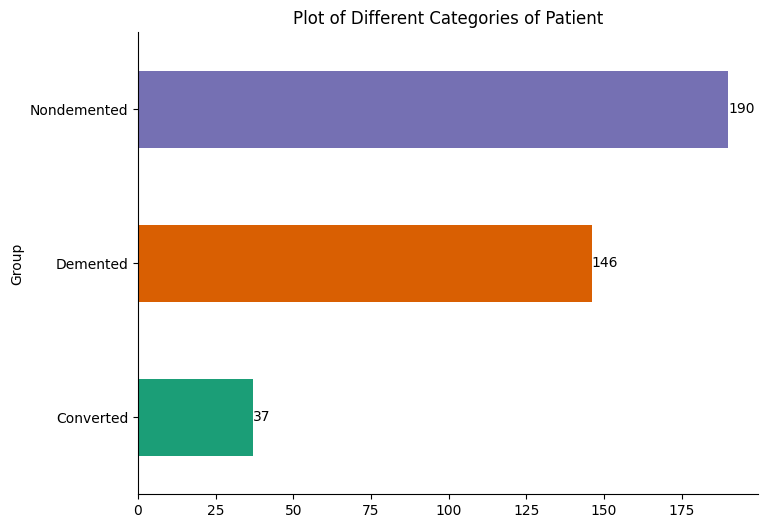

time: 241 ms (started: 2024-04-16 04:29:24 +00:00)


In [ ]:
def plot_barh(df, group_column, plot_title):
    grouped_df = df.groupby(group_column).size()
    plt.figure(figsize=(8, 6))
    ax = grouped_df.plot(kind='barh', color=sns.color_palette('Dark2'))
    plt.gca().spines[['top', 'right']].set_visible(False)
    plt.title(plot_title)
    for i, count in enumerate(grouped_df):
        ax.text(count, i, str(count), va='center', ha='left')

    plt.show()

plot_barh(df, 'Group', 'Plot of Different Categories of Patient')

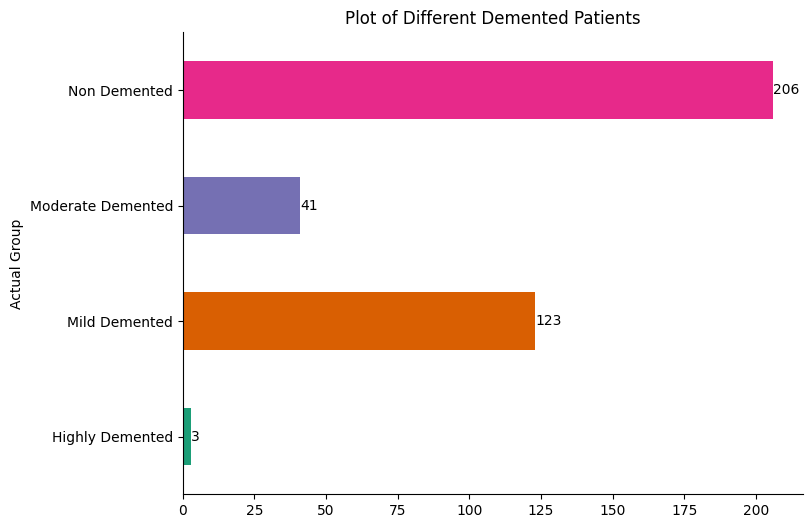

time: 201 ms (started: 2024-04-16 04:29:30 +00:00)


In [ ]:
plot_barh(df, 'Actual Group', 'Plot of Different Demented Patients')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


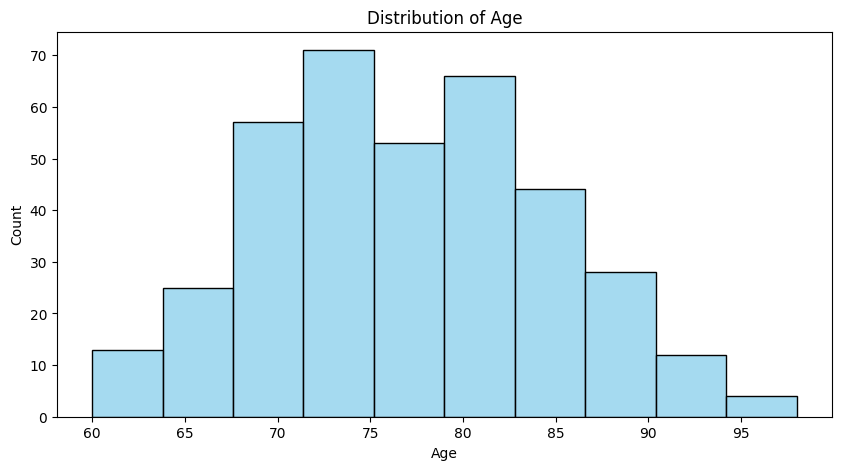

time: 325 ms (started: 2024-04-16 04:26:48 +00:00)


In [ ]:
def plot_hist(df, x_column, plot_title):
    ax = sns.histplot(x=x_column, data=df, bins = 10,color='skyblue')
    ax.figure.set_size_inches(10, 5)
    ax.set_title(plot_title)
    plt.show()
plot_hist(df, 'Age', "Distribution of Age")

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


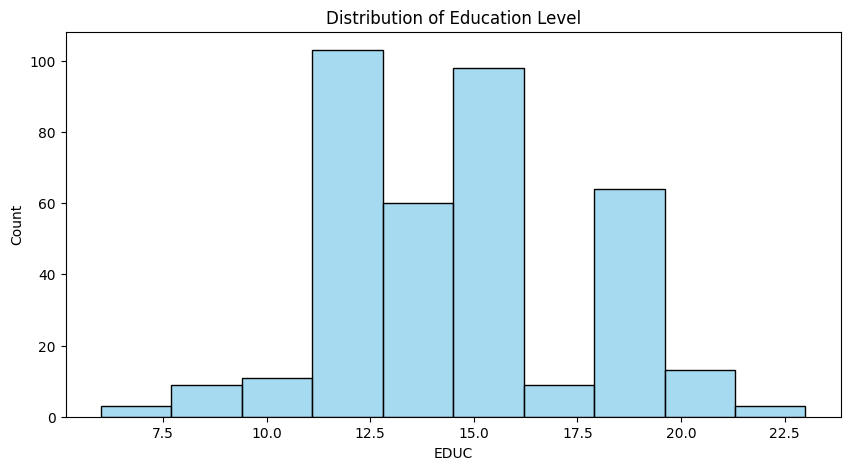

time: 307 ms (started: 2024-04-16 04:26:51 +00:00)


In [ ]:
plot_hist(df, 'EDUC', "Distribution of Education Level")

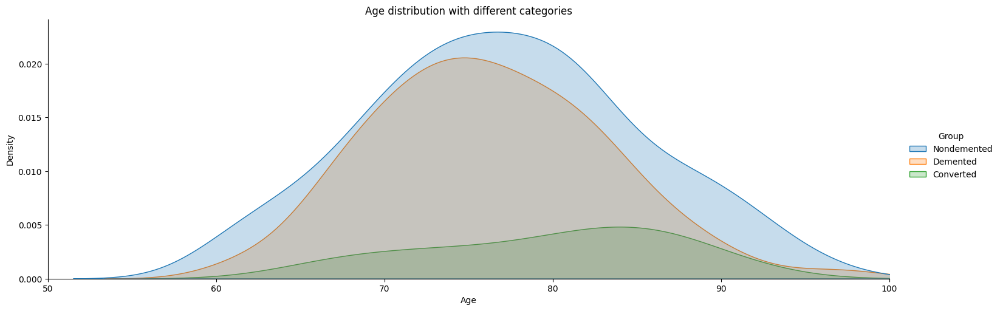

time: 767 ms (started: 2024-04-09 17:59:51 +00:00)


In [ ]:
def plot_distribution(df, hue_column, x_column, plot_title):
    sns.displot(df, x=x_column, hue=hue_column, kind="kde", fill=True, aspect=3)
    plt.title(plot_title)
    plt.show()
plot_distribution(df, "Group", "Age", "Age distribution with different categories")

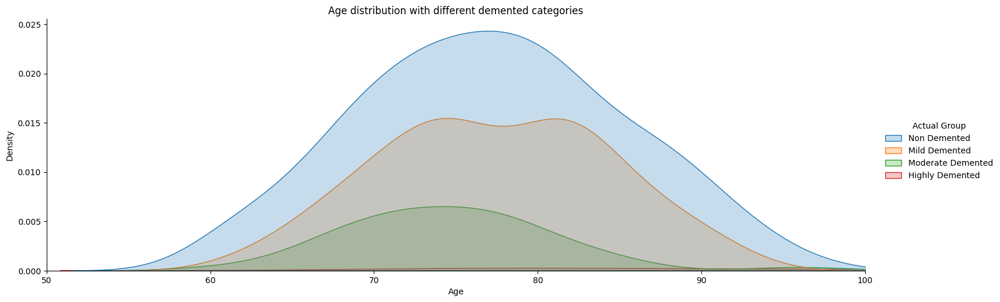

time: 519 ms (started: 2024-04-09 17:59:57 +00:00)


In [ ]:
plot_distribution(df, "Actual Group", "Age", "Age distribution with different demented categories")

## MRI SCANS DATA

**Subject Organization:**

The MRI data is organized into 150 subjects, with 100 subjects in one folder (OAS2_RAW_PART1) and 50 subjects in another folder (OAS2_RAW_PART2).
File Structure:

**Each subject folder contains:**
A RAW folder: Contains .nifti.img or .nifti.hdr files, which are the MRI scan data files.
An OLD folder: Contains previous scan files, also in .nifti.img and .nifti.hdr format.
File Content:

* .nifti.img files: Actual image data files.
* .nifti.hdr files: Header files providing metadata for the corresponding image data.

**Image Viewing:**

* To view an MRI scan, both the .nifti.img and .nifti.hdr files need to be present in the same folder.
* MRI images are 3D and can be visualized along different axes (e.g., sagittal, coronal, axial).
* To view a specific slice of the MRI scan (e.g., side view of the head), the appropriate axis and frame need to be selected. For example, image[:,:,70,3] would represent the side view at the 70th frame.

#### Downloading Data directly from the OASIS website

In [ ]:
path = os.getcwd()

'/content'

time: 7.57 ms (started: 2024-04-10 10:08:20 +00:00)


In [ ]:
!wget https://download.nrg.wustl.edu/data/OAS2_RAW_PART1.tar.gz

--2024-04-10 10:08:37--  https://download.nrg.wustl.edu/data/OAS2_RAW_PART1.tar.gz

Resolving download.nrg.wustl.edu (download.nrg.wustl.edu)... 128.252.217.126

Connecting to download.nrg.wustl.edu (download.nrg.wustl.edu)|128.252.217.126|:443... connected.

HTTP request sent, awaiting response... 200 OK

Length: 10874461059 (10G) [application/x-gzip]

Saving to: ‘OAS2_RAW_PART1.tar.gz’



OAS2_RAW_PART1.tar. 100%[===================>]  10.13G  46.3MB/s    in 3m 49s  



2024-04-10 10:12:26 (45.4 MB/s) - ‘OAS2_RAW_PART1.tar.gz’ saved [10874461059/10874461059]



time: 3min 49s (started: 2024-04-10 10:08:37 +00:00)


In [ ]:
#unzipping
!tar -xf /content/OAS2_RAW_PART1.tar.gz

time: 5min 18s (started: 2024-04-10 10:15:17 +00:00)


In [ ]:
!rm /content/OAS2_RAW_PART1.tar.gz

time: 405 ms (started: 2024-04-09 18:20:18 +00:00)


In [ ]:
!wget https://download.nrg.wustl.edu/data/OAS2_RAW_PART2.tar.gz

--2024-04-09 18:20:20--  https://download.nrg.wustl.edu/data/OAS2_RAW_PART2.tar.gz



Resolving download.nrg.wustl.edu (download.nrg.wustl.edu)... 128.252.217.126



Connecting to download.nrg.wustl.edu (download.nrg.wustl.edu)|128.252.217.126|:443... connected.



HTTP request sent, awaiting response... 200 OK



Length: 8449289603 (7.9G) [application/x-gzip]



Saving to: ‘OAS2_RAW_PART2.tar.gz’







OAS2_RAW_PART2.tar. 100%[===================>]   7.87G  48.1MB/s    in 2m 50s  







2024-04-09 18:23:11 (47.3 MB/s) - ‘OAS2_RAW_PART2.tar.gz’ saved [8449289603/8449289603]







time: 2min 50s (started: 2024-04-09 18:20:20 +00:00)


In [ ]:
!tar -xf /content/OAS2_RAW_PART2.tar.gz

time: 4min 11s (started: 2024-04-09 18:23:30 +00:00)


In [ ]:
!rm /content/OAS2_RAW_PART2.tar.gz

time: 305 ms (started: 2024-04-09 18:28:08 +00:00)


In [ ]:
source_dir = os.path.join('OAS2_RAW_PART2')
destination_dir = os.path.join('OAS2_RAW_PART1')

# Get list of files in source directory
files = os.listdir(source_dir)

# Move each file to the destination directory
for file in files:
    source_file_path = os.path.join(source_dir, file)
    destination_file_path = os.path.join(destination_dir, file)
    shutil.move(source_file_path, destination_file_path)

print("Files moved successfully!")

Files moved successfully!



time: 11.5 ms (started: 2024-04-09 18:28:12 +00:00)


In [ ]:
!rm -r /content/OAS2_RAW_PART2

time: 104 ms (started: 2024-04-09 18:28:15 +00:00)


## Data Transformation and Formatting (MRI)

* MRI images are sliced at specific frames along the side view (sagittal plane) to capture the maximum information relevant to Alzheimer's disease.
* Slicing is performed at frames 62, 64, 68, 70, and 72, covering the range from 60 to 75.
* Slicing is focused on the side view because Alzheimer's disease first impacts the hippocampus, which is more visible in the side view compared to top view images.

**Data Duplication:**

* Slicing the images at multiple frames (62, 64, 68, 70, and 72) results in the creation of duplicate images, each capturing different aspects of the MRI scan.

**Effectiveness:**

* This approach captures more detailed information relevant to Alzheimer's disease progression compared to processing only top view images, as it focuses on the side view where changes in the hippocampus are more pronounced.

#### Plotting few Nifit files

In [ ]:
def plot_images_with_categories(directory, df):
    image_files = [file for file in os.listdir(directory)]

    num_images = min(len(image_files), 6)  # Limit to 6 images or less if there are fewer files

    # Create a subplot based on the number of images
    fig, axes = plt.subplots(nrows=1, ncols=num_images, figsize=(18, 5))

    # Iterate through the image files and plot each rotated image
    for i, img_file in enumerate(image_files[:num_images]):
        img_path = os.path.join(directory, img_file)

        # Extract MRI ID from the parent folder name
        mri_id = os.path.basename(os.path.dirname(directory))

        # Find corresponding row in DataFrame
        matching_row = df[df['MRI ID'] == mri_id]
        if not matching_row.empty:
            # Extract category from 'Actual Group' column
            category = matching_row.iloc[0]['Actual Group']
        else:
            mri_id = img_file[:13]
            matching_row = df[df['MRI ID'] == mri_id]
            if not matching_row.empty:
              category = matching_row.iloc[0]['Actual Group']
            else:
              category = 'Unknown'

        img = nib.load(img_path)
        img_data = img.get_fdata()

        # Rotate the image 90 degrees counterclockwise
        rotated_img_data = np.rot90(img_data)
        # Display the rotated image in the subplot
        axes.flat[i].imshow(rotated_img_data[:, :, img_data.shape[2]//2], cmap='gray')  # Displaying a central slice
        axes.flat[i].set_title(f"{img_file}\nCategory: {category}")
        axes.flat[i].axis('off')

    plt.tight_layout()
    plt.show()

time: 1.72 ms (started: 2024-04-10 10:20:45 +00:00)


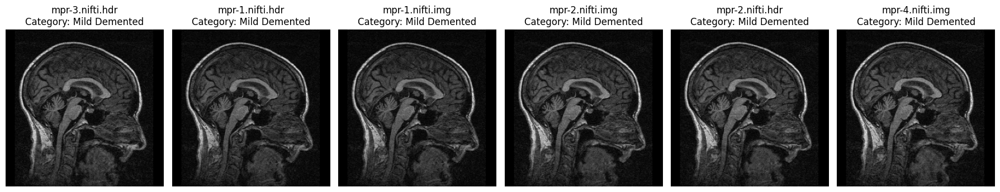

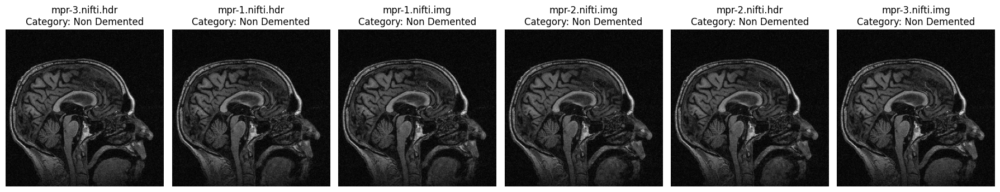

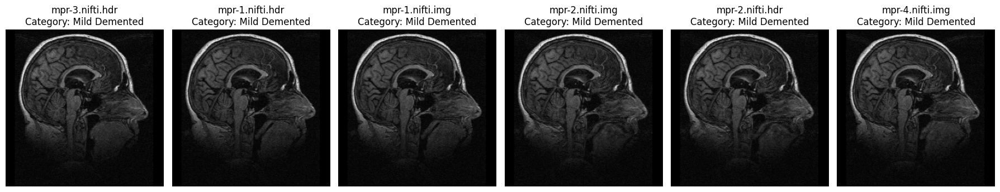

time: 4 s (started: 2024-04-10 10:21:11 +00:00)


In [ ]:
path1 = os.path.join('OAS2_RAW_PART1', 'OAS2_0010_MR1', 'RAW')
path2 = os.path.join('OAS2_RAW_PART1', 'OAS2_0001_MR1', 'RAW')
path3 = os.path.join('OAS2_RAW_PART1', 'OAS2_0099_MR1', 'RAW')
plot_images_with_categories(path1, df)
plot_images_with_categories(path2, df)
plot_images_with_categories(path3, df)

#### Formatting the Data into simpler form by removing unnecesssay files, folder and renaming in proper format while reffering to the demographics data.

In [ ]:
source_directory = os.path.join("OAS2_RAW_PART1")
destination_directory = os.path.join("Data")

# Iterate through each folder in the source directory
for root, dirs, files in os.walk(source_directory):
    for dir_name in dirs:
        # Check if the directory contains a RAW folder
        raw_directory = os.path.join(root, dir_name, "RAW")
        if os.path.exists(raw_directory):
            # Get the new name from the parent folder name
            new_name = os.path.basename(os.path.dirname(raw_directory))

            # Create destination directory if it doesn't exist
            if not os.path.exists(destination_directory):
                os.makedirs(destination_directory)

            # Iterate through each file in the RAW folder
            for filename in os.listdir(raw_directory):
                # Rename and copy image files to the destination directory
                if filename.endswith(".img") or filename.endswith(".hdr"):
                    # Get the file extension
                    file_ext = os.path.splitext(filename)[1]
                    # Construct new filename with nifti included
                    new_filename = f"{new_name}_{filename.split('-')[1].split('.')[0]}.nifti{file_ext}"
                    # Copy and rename the file
                    shutil.copy2(os.path.join(raw_directory, filename), os.path.join(destination_directory, new_filename))
                    # Delete the original file
                    os.remove(os.path.join(raw_directory, filename))

time: 3min 9s (started: 2024-04-10 10:23:25 +00:00)


#### Plotting few files randomly and their categories by matching it with the MRI ID in demographic data.


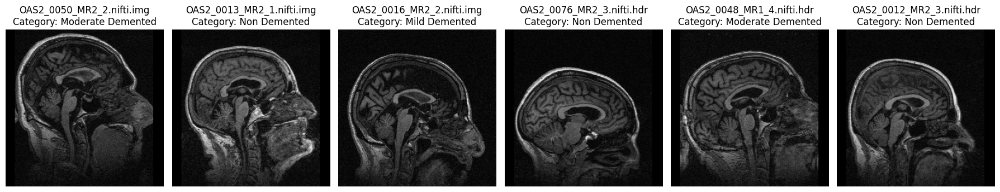

time: 1.58 s (started: 2024-04-10 10:26:45 +00:00)


In [ ]:
plot_images_with_categories(destination_directory, df)

#### Formatting the files by putting it in folders respective to their categories while reffering to the demographics data.

In [ ]:
data_directory = destination_directory

# Iterate through each file in the data directory
for file_name in os.listdir(data_directory):
    file_path = os.path.join(data_directory, file_name)

    # Extract MRI ID from the first 13 characters of the file name
    mri_id = file_name[:13]

    # Find corresponding row in DataFrame
    matching_row = df[df['MRI ID'] == mri_id]
    if not matching_row.empty:
        # Extract category from 'Actual Group' column
        category = matching_row.iloc[0]['Actual Group']

        # Create category directory if it doesn't exist
        category_directory = os.path.join(data_directory, category)
        if not os.path.exists(category_directory):
            os.makedirs(category_directory)

        # Move the file to the category directory
        new_file_path = os.path.join(category_directory, file_name)
        shutil.move(file_path, new_file_path)

time: 941 ms (started: 2024-04-10 10:26:54 +00:00)


## Visualization MRI

Plotting the different axes with multiple frames to find out the most informative slices.

#### Plotting different slices of images to select the final slice values.

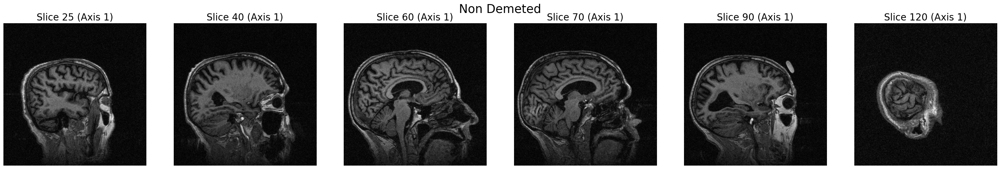

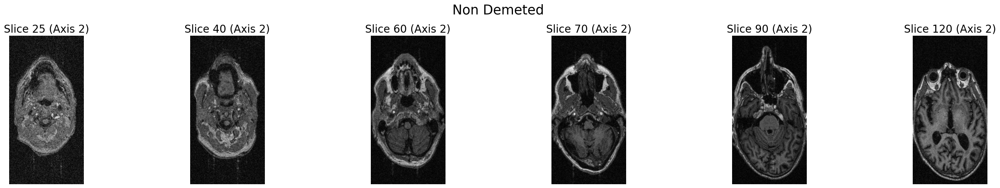

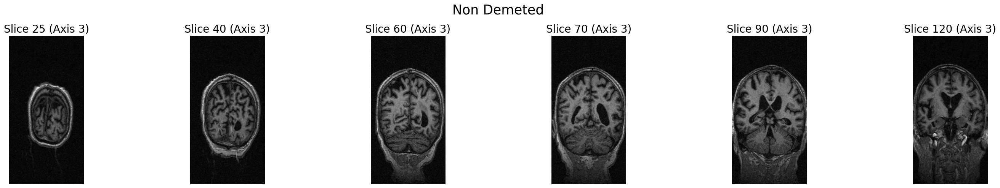

time: 9.21 s (started: 2024-04-10 10:27:53 +00:00)


In [ ]:
# Function to process a single NIfTI file
def process_nifti_file(file_path, slice_indices,title, slicing_method):
    img = nib.load(file_path)
    mri_images_data = img.get_fdata()
    # Transpose the data for visualization (adjusted for your array's shape)
    i = np.transpose(mri_images_data, (1, 0, 2, 3))

    # Get the filename without extension
    file_name = os.path.splitext(os.path.basename(file_path))[0]

    # Create the figure and subplots
    fig, axs = plt.subplots(1, len(slice_indices), figsize=(5 * len(slice_indices), 5))

    # Plot each slice
    for idx, slice_idx in enumerate(slice_indices):
        # Extract the slice data based on the specified method
        if slicing_method == 'Axis 1':
            slice_data = i[:, :, slice_idx, 0]
        elif slicing_method == 'Axis 2':
            slice_data = i[slice_idx, :, :, 0]
        elif slicing_method == 'Axis 3':
            slice_data = i[:, slice_idx, :, 0]
        else:
            raise ValueError("Invalid slicing method.")

        # Plot the slice on the corresponding subplot
        axs[idx].imshow(slice_data, origin='lower', cmap='gray')
        axs[idx].set_title(f'Slice {slice_idx} ({slicing_method})', fontsize=20)
        axs[idx].axis('off')

    # Adjust layout
    plt.suptitle(title,fontsize = 25)
    plt.tight_layout()
    plt.show()

# File path
file_path = os.path.join('Data','Non Demented','OAS2_0001_MR1_1.nifti.hdr')

# List of slice indices to extract
slice_indices = [25, 40, 60, 70, 90, 120]

# Slice method options
slicing_methods = ['Axis 1', 'Axis 2', 'Axis 3']

process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[0])
process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[1])
process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[2])

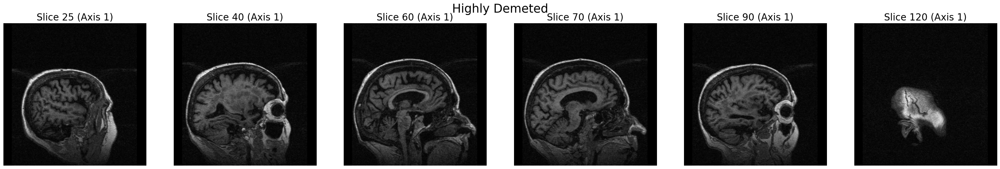

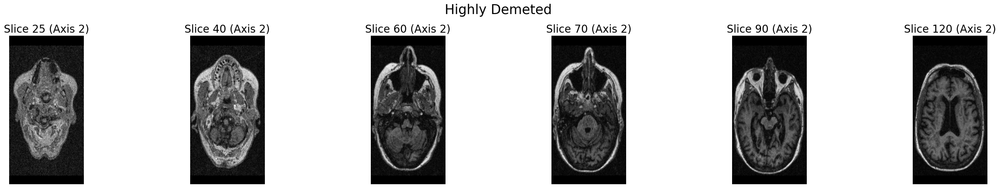

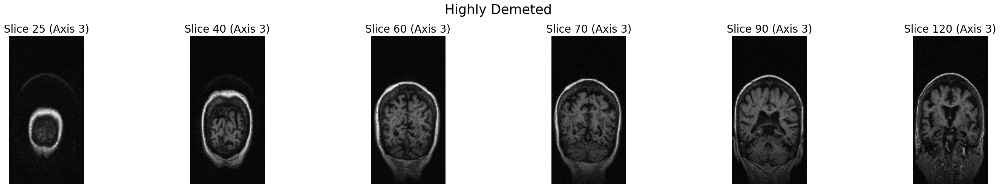

time: 3 s (started: 2024-04-09 19:08:14 +00:00)


In [ ]:
# File path
file_path = os.path.join('Data','Highly Demented','OAS2_0087_MR2_1.nifti.hdr')

# List of slice indices to extract
slice_indices = [25, 40, 60, 70, 90, 120]
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[0])
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[1])
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[2])

#### Saving the final slices and axes for Image Pre-processing and Modelling (This part of code might crash but rerunning it agian will also give the accurate results.)

In [ ]:
# Function to process a single NIfTI file
def process_nifti_file(file_path):
    img = nib.load(file_path)
    mri_images_data = img.get_fdata()

    # Transpose the data for visualization (adjusted for your array's shape)
    i = np.transpose(mri_images_data, (1, 0, 2, 3))

    # Get the filename without extension
    file_name = os.path.splitext(os.path.basename(file_path))[0]

    for idx in slice_indices:
        # Create the figure and plot
        plt.figure(figsize=(15, 5))
        f = i[:, :, idx, 0]

        # Display the slice
        plt.imshow(f, origin='lower')

        # Save the slice as a JPG file

        slice_file_name = f"{file_name}_{idx}.jpg"
        plt.axis('off')
        plt.savefig(os.path.join(os.path.dirname(file_path), slice_file_name), bbox_inches='tight', pad_inches=0)
        plt.close()  # Close the current figure to avoid displaying it

# List of slice indices to extract
slice_indices = [62,64, 66, 68, 70, 72]

# Iterate through each folder and process the files
for root, dirs, files in os.walk(data_directory):
    for file in files:
        if file.endswith(".nifti.hdr"):
            file_path = os.path.join(root, file)
            process_nifti_file(file_path)
            # Delete the original NIfTI files
            os.remove(file_path)

time: 5min 46s (started: 2024-04-09 19:25:58 +00:00)


#### Removing Unnecessary files

In [ ]:
def remove_and_rename_files(directory):
    # Iterate through each folder and its contents
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.nifti.img'):
                # Remove files ending with '.nifti.img'
                os.remove(os.path.join(root, file))
            else:
                # Rename files containing '.nifti' to contain 'slice' instead
                if '.nifti' in file:
                    new_name = file.replace('.nifti', 'slice')
                    os.rename(os.path.join(root, file), os.path.join(root, new_name))

# Remove files ending with '.nifti.img' and rename files containing '.nifti'
remove_and_rename_files(data_directory)

print("Files removed and renamed successfully.")

Files removed and renamed successfully.



time: 1.47 s (started: 2024-04-09 19:34:29 +00:00)


## Image Preprocessing

In [ ]:
current_dir = os.getcwd()
data_path = os.path.join(current_dir, "Data")

time: 548 µs (started: 2024-04-11 17:05:18 +00:00)


In [ ]:
data_dir = pathlib.Path(data_path)

# Get the class names
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['Highly Demented' 'Mild Demented' 'Moderate Demented' 'Non Demented']
time: 1.81 ms (started: 2024-04-11 17:05:22 +00:00)


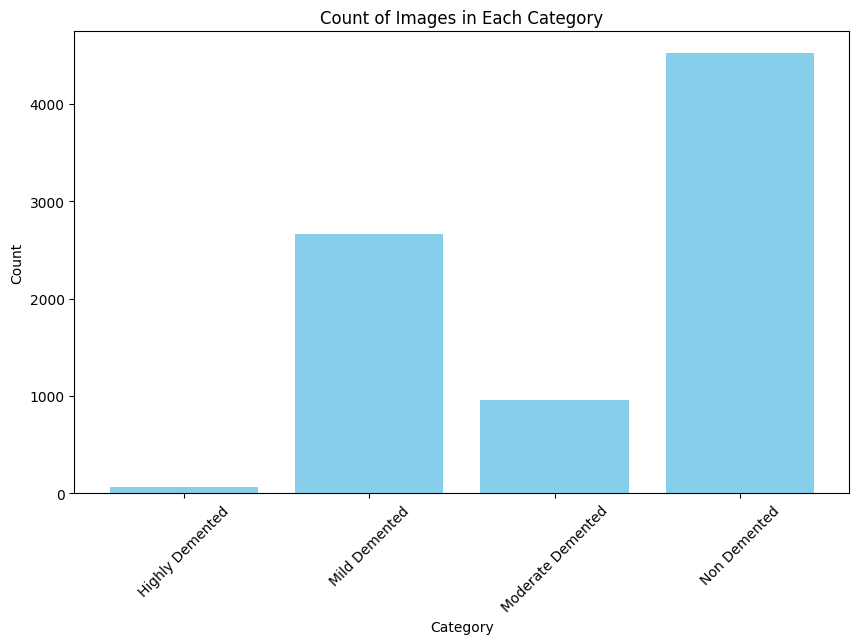

time: 276 ms (started: 2024-04-11 17:05:25 +00:00)


In [ ]:
def plot_class_counts(data_dir):
    # Get class names
    class_names = np.array(sorted([item.name for item in os.scandir(data_dir) if item.is_dir()]))

    # Count the number of images in each class
    class_counts = []
    for class_name in class_names:
        class_counts.append(len(os.listdir(os.path.join(data_dir, class_name))))

    # Plot the count of each category
    plt.figure(figsize=(10, 6))
    plt.bar(class_names, class_counts, color='skyblue')
    plt.xlabel('Category')
    plt.ylabel('Count')
    plt.title('Count of Images in Each Category')
    plt.xticks(rotation=45)
    plt.show()

plot_class_counts(data_dir)

In [ ]:
# Define paths
source_path = os.path.join(data_path, "Highly Demented")
destination_path = os.path.join(data_path, "Moderate Demented")
source_dir = pathlib.Path(source_path)
destination_dir = pathlib.Path(destination_path)

# Move files from source to destination
for file_name in os.listdir(source_dir):
    source_file = os.path.join(source_dir, file_name)
    destination_file = os.path.join(destination_dir, file_name)
    shutil.move(source_file, destination_file)

# Delete the 'Highly Demented' folder
shutil.rmtree(source_path)

time: 4.74 ms (started: 2024-04-11 17:05:27 +00:00)


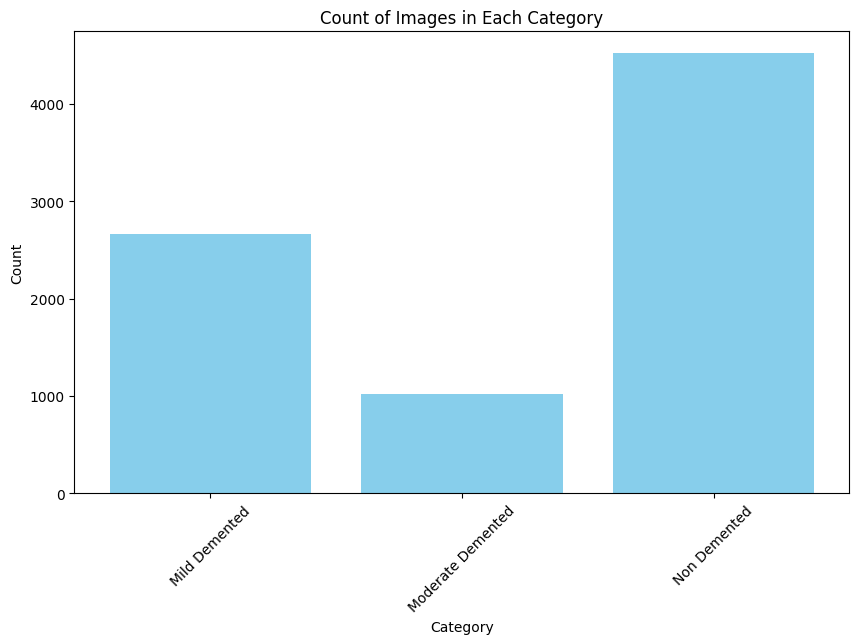

time: 178 ms (started: 2024-04-11 17:05:28 +00:00)


In [ ]:
plot_class_counts(data_dir)

#### Data Augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

categories = ['Mild Demented', 'Moderate Demented', 'Non Demented']
# Define target number of images
target_count = 4000

# Initialize ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest')

# Iterate over each category
for category in categories:
    category_folder = os.path.join(data_dir, category)
    images = os.listdir(category_folder)
    num_images = len(images)

    # Check if the category needs augmentation
    if num_images < target_count:
        print(f'Augmenting images for {category}...')
        # Calculate the number of additional images needed
        augment_count = target_count - num_images
        print(f'Augmenting {augment_count} images...')
        augment_iter = datagen.flow_from_directory(
            data_dir,
            target_size=(150, 150),
            classes=[category],
            batch_size=1,
            class_mode=None,
            shuffle=True,
            save_to_dir=category_folder,
            save_prefix='aug_',
            save_format='jpg'
        )
        # Generate and save additional images
        for i in range(augment_count):
            augment_batch = next(augment_iter)

Augmenting images for Mild Demented...
Augmenting 1336 images...
Found 2664 images belonging to 1 classes.
Augmenting images for Moderate Demented...
Augmenting 2980 images...
Found 1020 images belonging to 1 classes.
time: 25.3 s (started: 2024-04-11 17:05:31 +00:00)


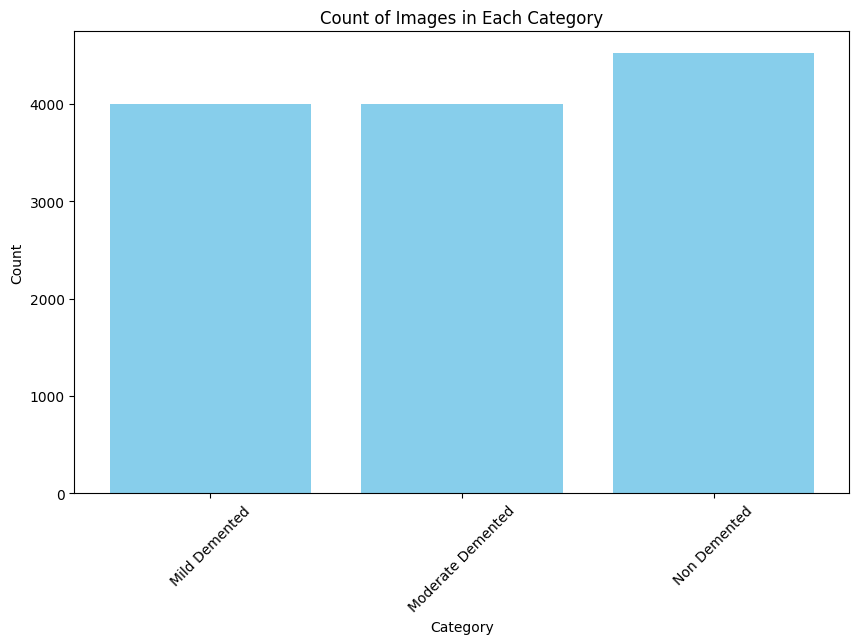

time: 177 ms (started: 2024-04-11 17:06:00 +00:00)


In [ ]:
plot_class_counts(data_dir)

In [ ]:
data = tf.keras.utils.image_dataset_from_directory(data_path,
                                                batch_size = 32,
                                                image_size=(385, 385),
                                                shuffle=True,
                                                seed=42,)
class_names = data.class_names

Found 12518 files belonging to 3 classes.
time: 3.09 s (started: 2024-04-11 17:06:05 +00:00)


In [ ]:
def train_test_val_split(data, train_size, val_size, test_size):
    train = int(len(data) * train_size)
    val = int(len(data) * val_size)
    test = int(len(data) * test_size)

    train_data = data.take(train)
    val_data = data.skip(train).take(val)
    test_data = data.skip(train + val).take(test)

    return train_data, val_data, test_data

train_data, val_data, test_data = train_test_val_split(data, train_size=0.8, val_size=0.1, test_size=0.1)

time: 12.7 ms (started: 2024-04-11 17:06:11 +00:00)


In [ ]:
def normalize_images(images, labels):
    images = tf.cast(images, tf.float32) / 255.0
    return images, labels

time: 501 µs (started: 2024-04-11 17:06:12 +00:00)


In [ ]:
# Apply normalization to datasets
train_data = train_data.map(normalize_images)
val_data = val_data.map(normalize_images)
test_data = test_data.map(normalize_images)

# Prefetch and cache the datasets for better performance
train_data = train_data.prefetch(tf.data.experimental.AUTOTUNE)
val_data = val_data.prefetch(tf.data.experimental.AUTOTUNE)
test_data = test_data.prefetch(tf.data.experimental.AUTOTUNE)

time: 68.9 ms (started: 2024-04-11 17:06:14 +00:00)


## Image Visualization

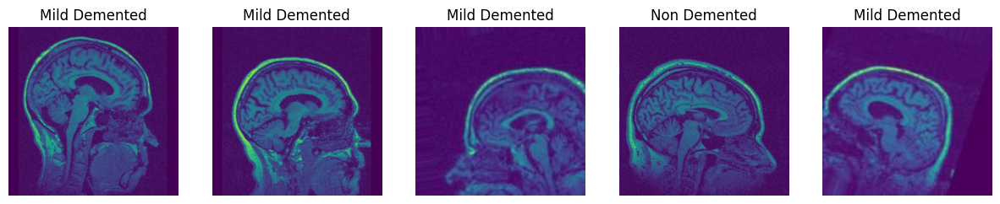

time: 939 ms (started: 2024-04-11 09:49:42 +00:00)


In [ ]:
def plot_sample_images(data, class_names):
    for images, labels in train_data.take(1):
        sample_images = images[:5]
        sample_labels = labels[:5]

    # Plot the images with their categories
    plt.figure(figsize=(15, 10))
    for i in range(5):
        plt.subplot(1, 5, i + 1)
        plt.imshow(sample_images[i])
        plt.title(class_names[sample_labels[i]])
        plt.axis("off")
    plt.show()
plot_sample_images(train_data, class_names)

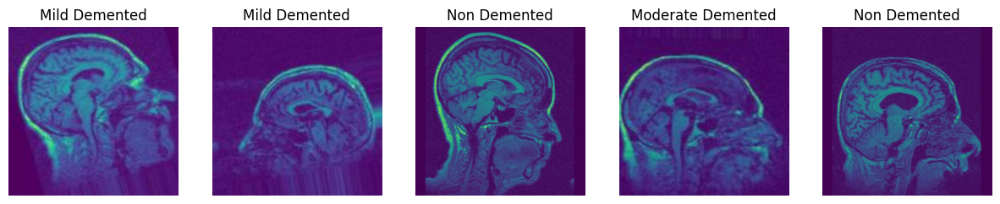

time: 945 ms (started: 2024-04-11 09:49:45 +00:00)


In [ ]:
plot_sample_images(test_data, class_names)

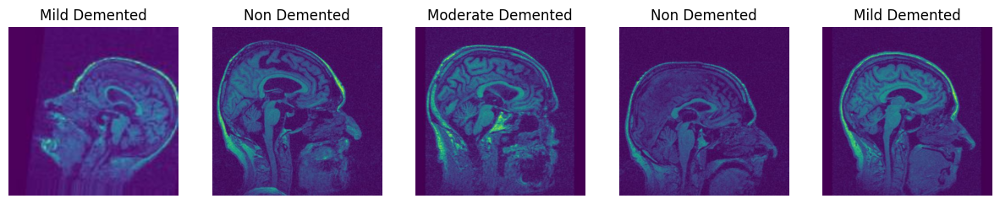

time: 870 ms (started: 2024-04-11 09:49:48 +00:00)


In [ ]:
plot_sample_images(val_data, class_names)

## Principle Component Analysis (PCA)

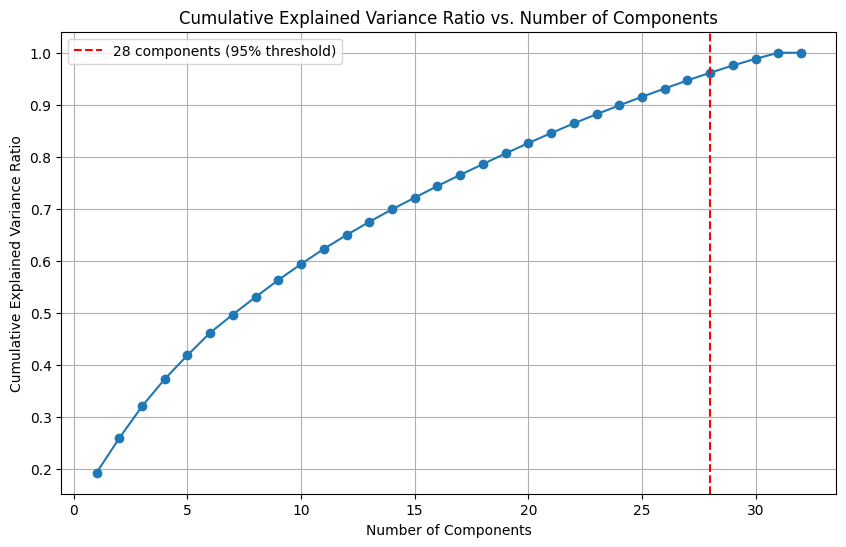

time: 6.77 s (started: 2024-04-11 09:10:02 +00:00)


In [ ]:
from sklearn.decomposition import PCA
for images, _ in train_data.take(100):
    X = images.numpy().reshape(images.shape[0], -1)

# Fit PCA
pca = PCA()
pca.fit(X)

# Calculate cumulative explained variance ratio
cumulative_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components that retains a significant amount of variance (95% threshold)
n_components = np.argmax(cumulative_explained_variance_ratio >= 0.95) + 1

# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance_ratio) + 1), cumulative_explained_variance_ratio, marker='o', linestyle='-')
plt.axvline(x=n_components, color='red', linestyle='--', label=f'{n_components} components (95% threshold)')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
plt.legend()
plt.grid(True)
plt.show()

## Modelling

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D,Input
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

time: 5.41 ms (started: 2024-04-11 17:06:20 +00:00)


#### CNN (Convolutional Neural Network)

**Base CNN Model**

In [ ]:
input_shape = (385, 385, 3)
first_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

first_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
first_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 383, 383, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 191, 191, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 189, 189, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 94, 94, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 565504)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │    18,096,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,115,651 (69.11 MB)

 Trainable params: 18,115,651 (69.11 MB)

 Non-trainable params: 0 (0.00 B)

time: 64.4 ms (started: 2024-04-10 05:12:33 +00:00)


In [ ]:
first_history = first_model.fit(train_data, epochs=20, validation_data=val_data)

Epoch 1/20

  1/313 ━━━━━━━━━━━━━━━━━━━━ 1:56:29 22s/step - accuracy: 0.3438 - loss: 1.1030

W0000 00:00:1712726002.227437     158 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.4630 - loss: 1.6449

W0000 00:00:1712726045.979475     158 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 68s 145ms/step - accuracy: 0.4634 - loss: 1.6427 - val_accuracy: 0.8429 - val_loss: 0.3859

Epoch 2/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - accuracy: 0.7746 - loss: 0.5077 - val_accuracy: 0.8790 - val_loss: 0.2830

Epoch 3/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - accuracy: 0.8436 - loss: 0.3509 - val_accuracy: 0.8814 - val_loss: 0.2676

Epoch 4/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - accuracy: 0.8629 - loss: 0.3005 - val_accuracy: 0.8998 - val_loss: 0.2285

Epoch 5/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - accuracy: 0.8783 - loss: 0.2688 - val_accuracy: 0.9022 - val_loss: 0.2079

Epoch 6/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - accuracy: 0.8853 - loss: 0.2465 - val_accuracy: 0.8982 - val_loss: 0.2425

Epoch 7/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - accuracy: 0.8943 - loss: 0.2328 - val_accuracy: 0.8918 - val_loss: 0.2818

Epoch 8/20

313/313 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - accuracy: 0.8987 - loss

In [ ]:
def plot_history(history):
    # Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

time: 989 µs (started: 2024-04-11 17:06:30 +00:00)


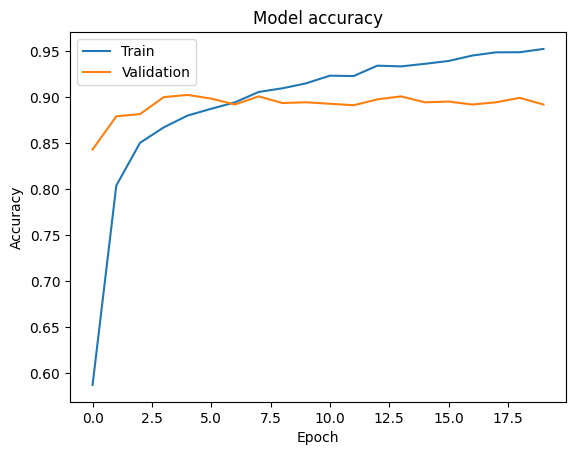

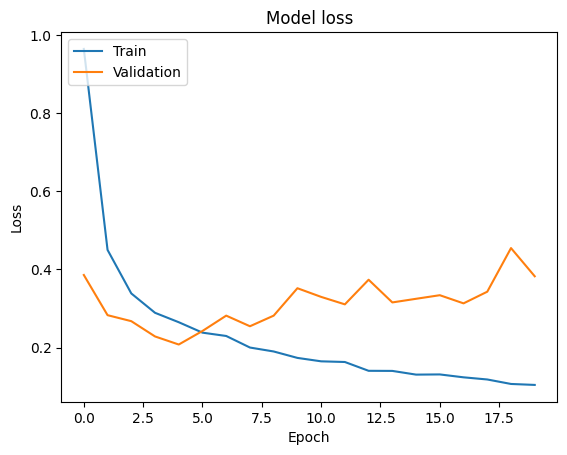

time: 568 ms (started: 2024-04-10 05:27:59 +00:00)


In [ ]:
plot_history(first_history)

In [ ]:
first_model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - accuracy: 0.8781 - loss: 0.4196


[0.3764576315879822, 0.8854166865348816]

time: 10.2 s (started: 2024-04-10 05:50:36 +00:00)


**Final CNN Model**

In [ ]:

def cnn_model(input_shape):
    model = Sequential()

    model.add(Conv2D(filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal',
                     input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_initializer='he_normal'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(4, activation="softmax"))

    model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

    model.summary()

    return model

# Input shape should match your data shape (e.g., (385, 385, 3))
input_shape = (385, 385, 3)

# Build the simple CNN model
model = cnn_model(input_shape)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 383, 383, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 191, 191, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 189, 189, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 94, 94, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 92, 92, 128)    │        36,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 46, 46, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 270848)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    34,668,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,719,268 (132.44 MB)

 Trainable params: 34,719,268 (132.44 MB)

 Non-trainable params: 0 (0.00 B)

time: 181 ms (started: 2024-04-11 17:06:42 +00:00)


In [ ]:
def checkpoint_callback():
    checkpoint_filepath = '/temp/cp.keras'
    model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath,
                                                 save_weights_only=False,
                                                 save_best_only=True,
                                                 monitor='val_loss',
                                                 verbose=1)
    return model_checkpoint_callback

def early_stopping(patience):
    es_callback = EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    return es_callback
EPOCHS = 70
checkpoint_callback = checkpoint_callback()
early_stopping = early_stopping(patience=20)
callbacks = [checkpoint_callback, early_stopping]

time: 1.11 ms (started: 2024-04-11 17:06:49 +00:00)


In [ ]:
cnn_history = model.fit(train_data, epochs=EPOCHS, validation_data=val_data, callbacks=callbacks)

Epoch 1/70

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.3918 - loss: 2.9313

Epoch 1: val_accuracy improved from -inf to 0.64583, saving model to /temp/cp.keras

313/313 ━━━━━━━━━━━━━━━━━━━━ 68s 161ms/step - accuracy: 0.3921 - loss: 2.9266 - val_accuracy: 0.6458 - val_loss: 0.7380

Epoch 2/70

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.6484 - loss: 0.7510

Epoch 2: val_accuracy improved from 0.64583 to 0.86058, saving model to /temp/cp.keras

313/313 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.6485 - loss: 0.7508 - val_accuracy: 0.8606 - val_loss: 0.3753

Epoch 3/70

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.7673 - loss: 0.4933

Epoch 3: val_accuracy improved from 0.86058 to 0.88221, saving model to /temp/cp.keras

313/313 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.7674 - loss: 0.4931 - val_accuracy: 0.8822 - val_loss: 0.2751

Epoch 4/70

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8235 - loss: 0.3837

Epoch 4: val_accurac

###### Analysis

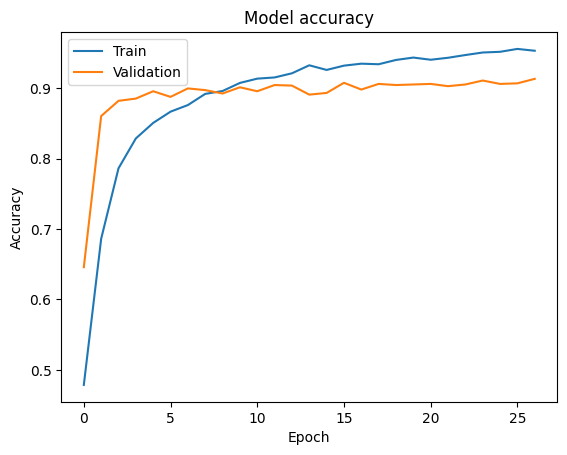

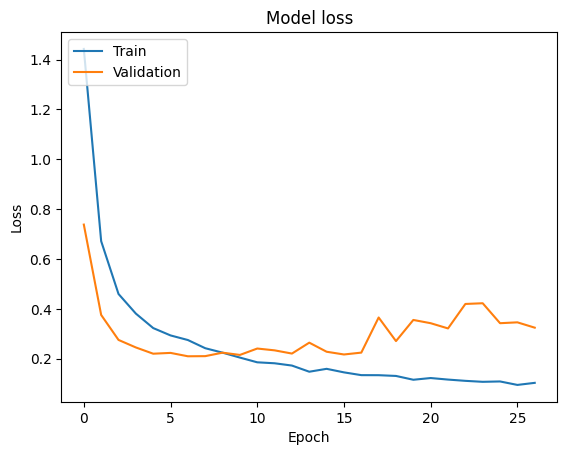

time: 476 ms (started: 2024-04-10 05:50:36 +00:00)


In [ ]:
plot_history(cnn_history)

In [ ]:
model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.8982 - loss: 0.3389


[0.3720785677433014, 0.8902243375778198]

time: 13.1 s (started: 2024-04-10 05:51:46 +00:00)


In [ ]:
model.save('/kaggle/working/cnn_model.h5')

time: 824 ms (started: 2024-04-11 17:30:53 +00:00)


Classification Report:

                   precision    recall  f1-score   support



    Mild Demented       0.85      0.75      0.80       375

Moderate Demented       0.80      0.89      0.84       426

     Non Demented       1.00      1.00      1.00       447



         accuracy                           0.89      1248

        macro avg       0.89      0.88      0.88      1248

     weighted avg       0.89      0.89      0.89      1248




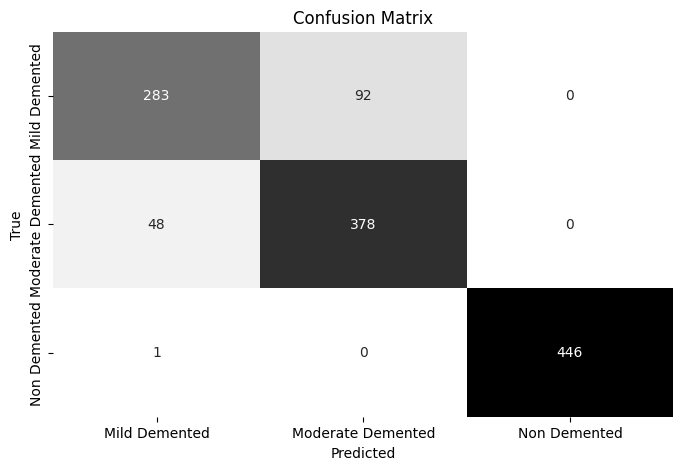

time: 22.7 s (started: 2024-04-10 05:58:01 +00:00)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
def report(model, test_data, class_names):
    # Generate predictions
    predictions = []
    labels = []
    for X, y in test_data.as_numpy_iterator():
        y_pred = model.predict(X, verbose=0)
        y_prediction = np.argmax(y_pred, axis=1)
        predictions.extend(y_prediction)
        labels.extend(y)

    predictions = np.array(predictions)
    labels = np.array(labels)

    # Generate classification report
    print("Classification Report:")
    print(classification_report(labels, predictions, target_names=class_names))

    # Generate confusion matrix
    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    # Plot confusion matrix
    plt.figure(figsize=(8, 5))
    sns.heatmap(cm_df, annot=True, fmt="d", cmap="Greys", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

report(model, test_data, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


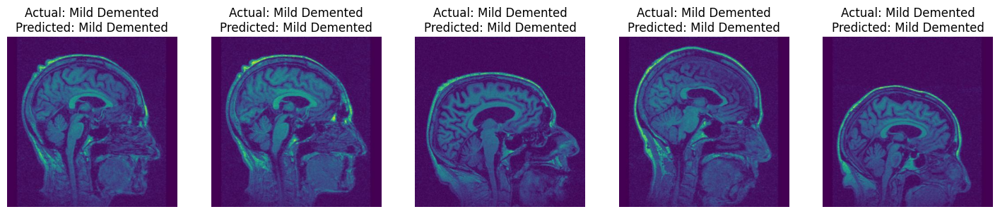

time: 12.4 s (started: 2024-04-10 05:59:19 +00:00)


In [ ]:
def plot_predictions(test_data, model, class_names):
    plt.figure(figsize=(18, 15))
    count = 0
    for images, labels in test_data.take(1):
        # Denormalize images
        images = images * 255.0

        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)
        # Filter images and labels for 'Mild Demented' category
        mild_demented_mask = labels.numpy() == class_names.index('Mild Demented')
        images_mild_demented = images.numpy()[mild_demented_mask]
        labels_mild_demented = labels.numpy()[mild_demented_mask]
        predicted_labels_mild_demented = predicted_labels[mild_demented_mask]
        # Plot images
        for i in range(len(images_mild_demented)):
            if count < 5:
                plt.subplot(1, 5, count + 1)
                plt.imshow(images_mild_demented[i].astype("uint8"))
                plt.title(f'Actual: {class_names[labels_mild_demented[i]]}\nPredicted: {class_names[predicted_labels_mild_demented[i]]}')
                plt.axis('off')
                count += 1
            else:
                break

# Plot images with predicted labels for 'Mild Demented' category
plot_predictions(test_data, model, class_names)
plt.show()

###### Experimentation with CNN

In [ ]:
cnn2_history = model.fit(train_data, epochs=EPOCHS, validation_data=val_data, callbacks=callbacks)

Epoch 1/70
  1/313 ━━━━━━━━━━━━━━━━━━━━ 1:36:30 19s/step - accuracy: 0.0000e+00 - loss: 2.1892

I0000 00:00:1712855300.325176     114 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1712855300.346797     114 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.3676 - loss: 4.2961

W0000 00:00:1712855338.990352     113 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



Epoch 1: val_loss improved from inf to 0.69627, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 68s 160ms/step - accuracy: 0.3679 - loss: 4.2881 - val_accuracy: 0.6859 - val_loss: 0.6963
Epoch 2/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.6463 - loss: 0.7920
Epoch 2: val_loss improved from 0.69627 to 0.41282, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - accuracy: 0.6464 - loss: 0.7917 - val_accuracy: 0.8317 - val_loss: 0.4128
Epoch 3/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.7917 - loss: 0.4726
Epoch 3: val_loss improved from 0.41282 to 0.25873, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.7918 - loss: 0.4725 - val_accuracy: 0.8774 - val_loss: 0.2587
Epoch 4/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8635 - loss: 0.3133
Epoch 4: val_loss improved from 0.25873 to 0.23187, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - accu

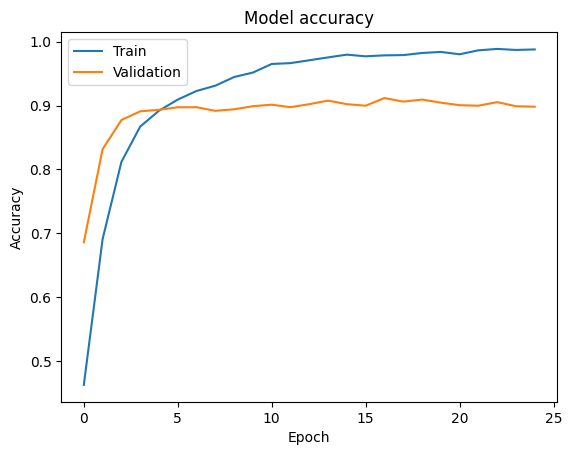

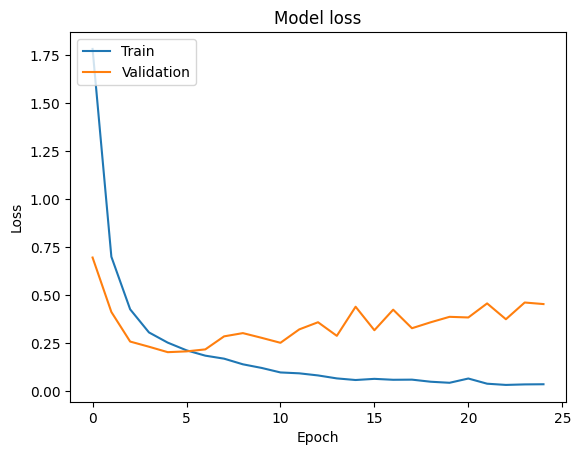

time: 553 ms (started: 2024-04-11 17:27:30 +00:00)


In [ ]:
plot_history(cnn2_history)

In [ ]:
model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.8868 - loss: 0.4983


[0.5426824688911438, 0.8790063858032227]

time: 13.2 s (started: 2024-04-11 17:28:11 +00:00)


In [ ]:
model.save('/kaggle/working/cnn2_model.h5')

time: 831 ms (started: 2024-04-11 17:30:29 +00:00)


#### VGG 16  (2hrs + Runtime)

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_vgg16_model(input_shape, num_classes):
    # Load the pre-trained VGG16 model without the top (classification) layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom top layers for classification
    x = Flatten()(base_model.output)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.25)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.25)(x)
    output = Dense(num_classes, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=base_model.input, outputs=output)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Define the input shape and number of classes
input_shape = (385, 385, 3)
num_classes = 3

# Build the VGG16 model with fine-tuning
vgg16_model = build_vgg16_model(input_shape, num_classes)

# Print model summary
vgg16_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 385, 385, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 385, 385, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 385, 385, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 192, 192, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 192, 192, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 192, 192, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 96, 96, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 96, 96, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 96, 96, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 96, 96, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 48, 48, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 48, 48, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 48, 48, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 48, 48, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 24, 24, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 12, 12, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 73728)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     9,437,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           19

 Total params: 24,160,451 (92.16 MB)

 Trainable params: 9,445,763 (36.03 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

time: 2.55 s (started: 2024-04-11 14:49:22 +00:00)


In [ ]:
history = vgg16_model.fit(
    train_data,
    epochs=50,
    validation_data=val_data,
    callbacks=callbacks)

Epoch 1/50


I0000 00:00:1712847101.092011     115 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1712847101.113147     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.5399 - loss: 0.9207

W0000 00:00:1712847229.828525     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



Epoch 1: val_loss improved from inf to 0.70777, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 230s 459ms/step - accuracy: 0.5400 - loss: 0.9205 - val_accuracy: 0.6827 - val_loss: 0.7078
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step - accuracy: 0.6467 - loss: 0.7532
Epoch 2: val_loss improved from 0.70777 to 0.58549, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 146s 465ms/step - accuracy: 0.6467 - loss: 0.7531 - val_accuracy: 0.7676 - val_loss: 0.5855
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step - accuracy: 0.7244 - loss: 0.6246
Epoch 3: val_loss improved from 0.58549 to 0.45642, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 145s 463ms/step - accuracy: 0.7244 - loss: 0.6246 - val_accuracy: 0.8229 - val_loss: 0.4564
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.7840 - loss: 0.5189
Epoch 4: val_loss improved from 0.45642 to 0.41537, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 145s 464ms/step

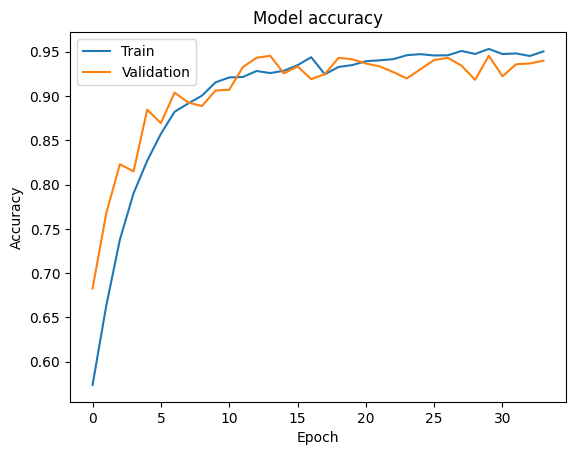

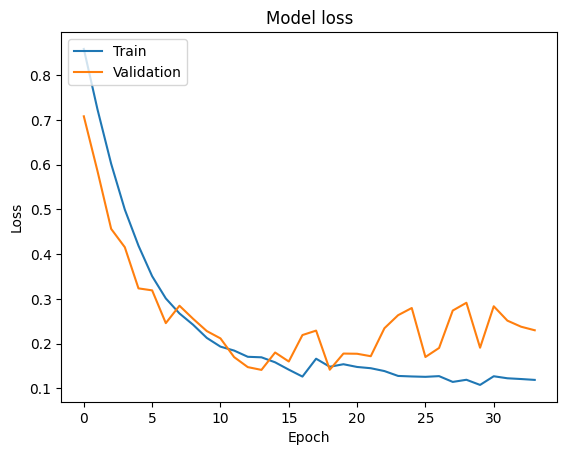

time: 518 ms (started: 2024-04-11 16:15:57 +00:00)


In [ ]:
plot_history(history)

In [ ]:
vgg16_model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 27s 388ms/step - accuracy: 0.9289 - loss: 0.2505


[0.25250276923179626, 0.9302884340286255]

time: 26.7 s (started: 2024-04-11 16:15:57 +00:00)


In [ ]:
vgg16_model.save('/kaggle/working/vgg16_model.h5')

time: 850 ms (started: 2024-04-11 17:31:20 +00:00)


W0000 00:00:1712852197.050703     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Classification Report:
                   precision    recall  f1-score   support

    Mild Demented       0.96      0.81      0.88       377
Moderate Demented       0.85      0.97      0.90       415
     Non Demented       1.00      1.00      1.00       456

         accuracy                           0.93      1248
        macro avg       0.93      0.93      0.93      1248
     weighted avg       0.94      0.93      0.93      1248



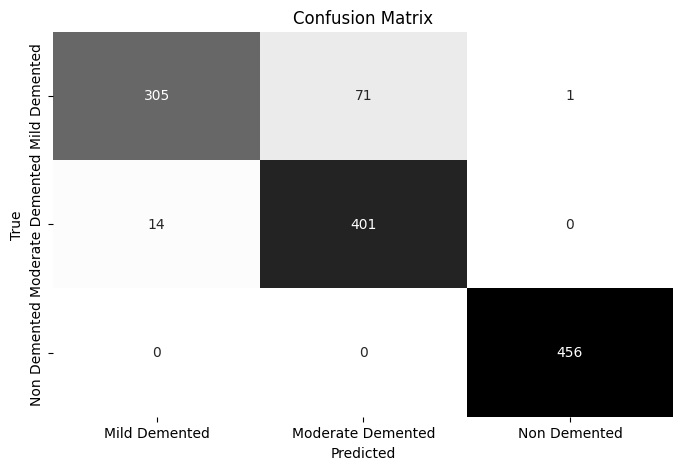

time: 36 s (started: 2024-04-11 16:16:24 +00:00)


In [ ]:
report(vgg16_model, test_data, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


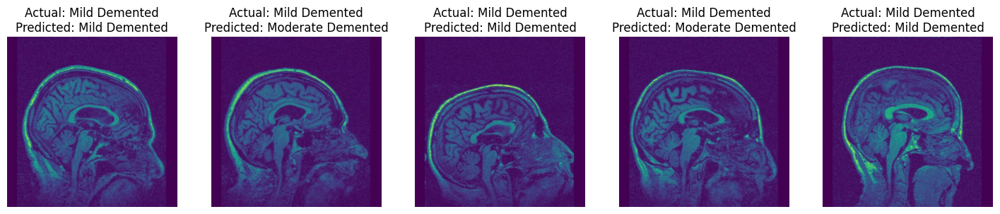

time: 8.7 s (started: 2024-04-11 16:17:00 +00:00)


In [ ]:
plot_predictions(test_data, vgg16_model, class_names)
plt.show()